In [5]:
from pyspark import SparkConf, SparkContext
from pyspark.sql.functions import *
sc.stop()
from pyspark.sql import SQLContext
conf = SparkConf().setAppName("App")
conf = (conf.set('spark.driver.memory', '60G').set("spark.yarn.executor.memoryOverhead", '4096'))
sc =SparkContext(conf=conf)
sqlContext = SQLContext(sc)
import pyspark.sql.functions as func
import sys
from pyspark.sql.functions import countDistinct

In [6]:
#reading in sticker type data
feature_data = sqlContext.read.parquet("gs://ds-url-catag/stick_statistics/derived_features/")


In [ ]:
#sampling of the data 
from pyspark.sql import functions as F
from pyspark.sql.window import Window

feature_data = feature_data.withColumn("row_number", F.row_number().over(Window.orderBy('user_id_n')))
feature_data = feature_data.withColumn("by_20k",lit(200))
feature_data = feature_data.withColumn("modulo",feature_data.row_number%feature_data.by_20k)
test_data = feature_data.where(col('modulo') == 0)

In [ ]:
#write the sample data to a file 
test_data.limit(20000).write.mode('overwrite').parquet("gs://ds-url-catag/clustering/clust_test_data")

In [ ]:
#reading in the sample data 
feature_test = sqlContext.read.parquet("gs://ds-url-catag/clustering/clust_test_data/")

In [ ]:
feature_test.count()

In [1]:
#convert pyspark to pandas dataframe
import pandas as pd
import pyarrow.parquet as pq
feature_data_df  = feature_test.toPandas()

NameError: name 'feature_test' is not defined

In [8]:
#checking size of dataframe
print 'Size of the dataframe: {}'.format(feature_data_df.shape)

Size of the dataframe: (20000, 12)


In [9]:
#logarithmic transformation of two different variables
import numpy as np
feature_data_df['log_noofdays']=np.log10(1+feature_data_df.numofdays)
feature_data_df['log_avg_con_days']=np.log10(1+feature_data_df.avg_con_days)
feature_data_df['log_sticker_packs_sent']=np.log10(1+feature_data_df.sticker_packs_sent)
feature_data_df['log_distinct_sticker_packs_sent']=np.log10(1+feature_data_df.distinct_sticker_packs_sent)
feature_data_df['log_sum_paid']=np.log10(1+feature_data_df.sum_paid)
feature_data_df['log_sum_free']=np.log10(1+feature_data_df.sum_free)
feature_data_df['log_sum_subs']=np.log10(1+feature_data_df.sum_subs)
feature_data_df['log_sum_discont']=np.log10(1+feature_data_df.sum_discont)


In [10]:
#computing PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=8)
pca_result = pca.fit_transform(feature_data_df[['log_noofdays','log_avg_con_days','log_sticker_packs_sent','log_distinct_sticker_packs_sent','log_sum_paid','log_sum_free','log_sum_subs','log_sum_discont']].values)

feature_data_df['pca-one'] = pca_result[:,0]
feature_data_df['pca-two'] = pca_result[:,1] 
feature_data_df['pca-three'] = pca_result[:,2]
feature_data_df['pca-four'] = pca_result[:,3]
feature_data_df['pca-five'] = pca_result[:,4]
feature_data_df['pca-six'] = pca_result[:,5]
feature_data_df['pca-seven'] = pca_result[:,6]
feature_data_df['pca-eight'] = pca_result[:,7]


print 'Explained variation per principal component: {}'.format(pca.explained_variance_ratio_)


Explained variation per principal component: [  8.58103907e-01   6.32244084e-02   4.73709760e-02   1.94404212e-02
   6.96170108e-03   3.53240763e-03   1.35310795e-03   1.30707911e-05]


In [11]:
import numpy as np
rndperm = np.random.permutation(feature_data_df.shape[0])

In [12]:
from ggplot import *
chart = ggplot(feature_data_df.loc[rndperm[:20000],:], aes(x='pca-one', y='pca-two') ) \
        + geom_point(size=75,alpha=0.8) \
        + ggtitle("First and Second Principal Components")
chart

/usr/local/lib/python2.7/dist-packages/ggplot/utils.py:81: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  pd.tslib.Timestamp,
/usr/local/lib/python2.7/dist-packages/ggplot/stats/smoothers.py:4: FutureWarning: The pandas.lib module is deprecated and will be removed in a future version. These are private functions and can be accessed from pandas._libs.lib instead
  from pandas.lib import Timestamp
/usr/local/lib/python2.7/dist-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


<ggplot: (8758938678221)>

In [77]:
feature_data_df.columns[20:22]

Index([u'pca-one', u'pca-two'], dtype='object')

For number of clusters:  4 variance is : 2894.37473883


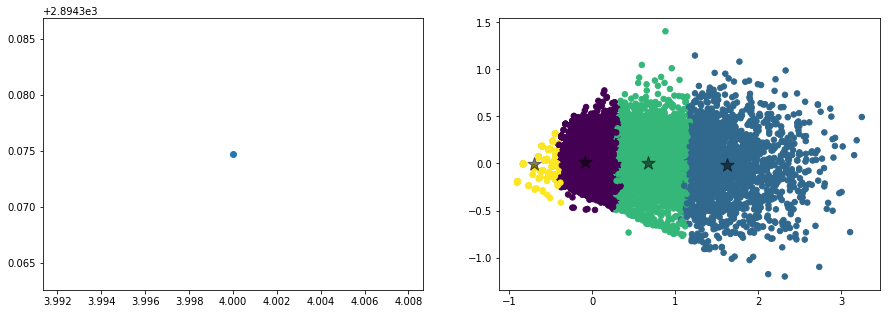

For number of clusters:  5 variance is : 2548.67977191


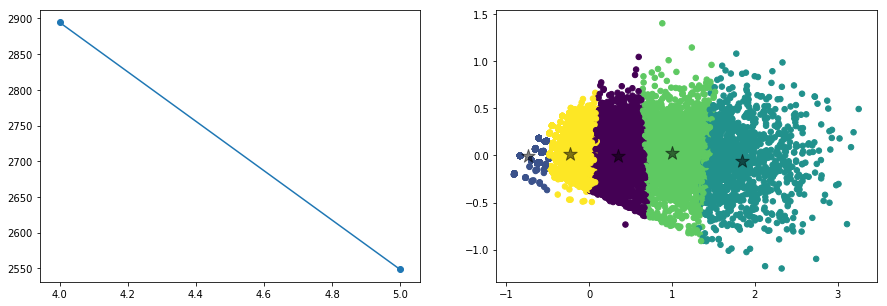

For number of clusters:  6 variance is : 2341.93700663


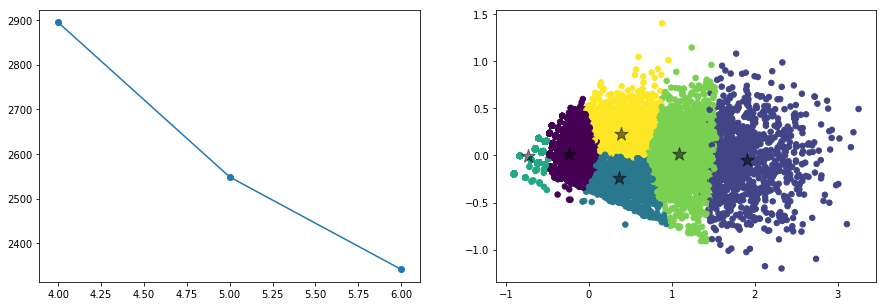

For number of clusters:  7 variance is : 2157.04340271


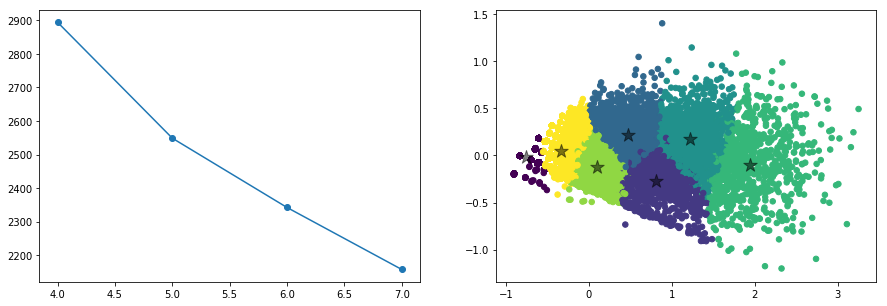

For number of clusters:  8 variance is : 1982.07228438


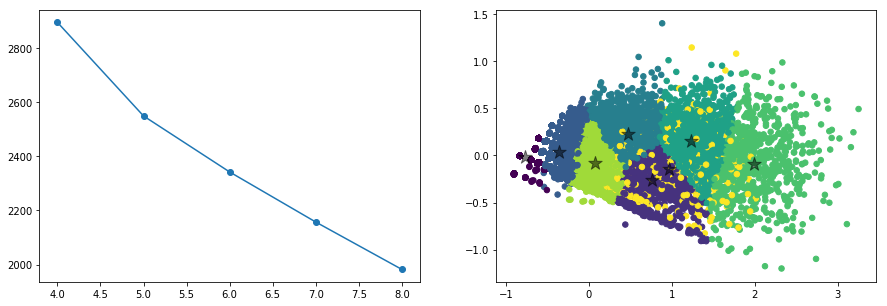

For number of clusters:  9 variance is : 1834.47696585


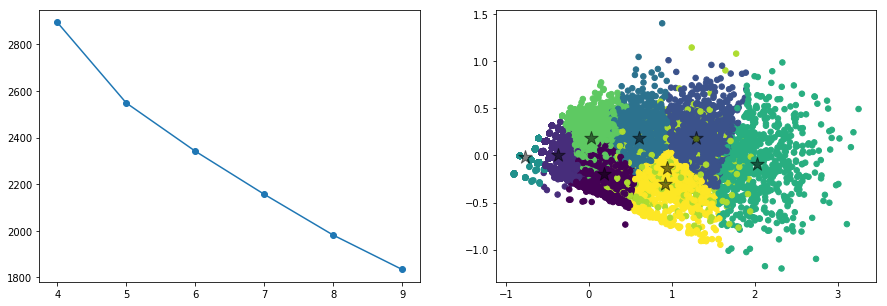

For number of clusters:  10 variance is : 1730.73082453


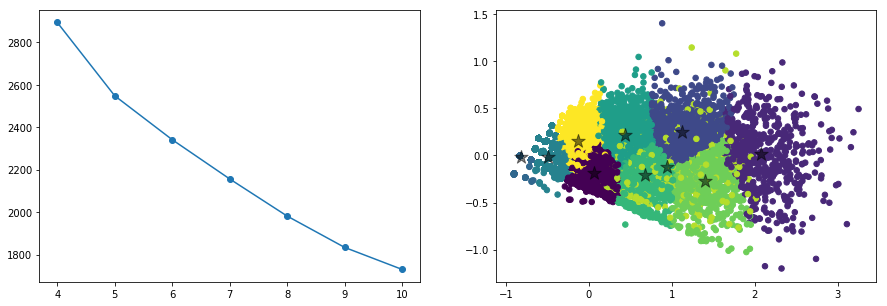

For number of clusters:  11 variance is : 1639.80449729


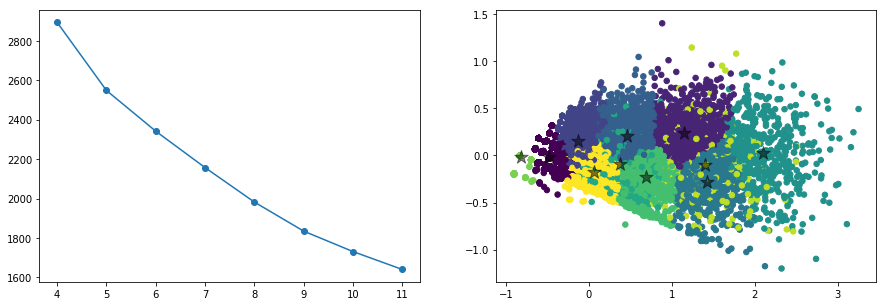

For number of clusters:  12 variance is : 1553.04125169


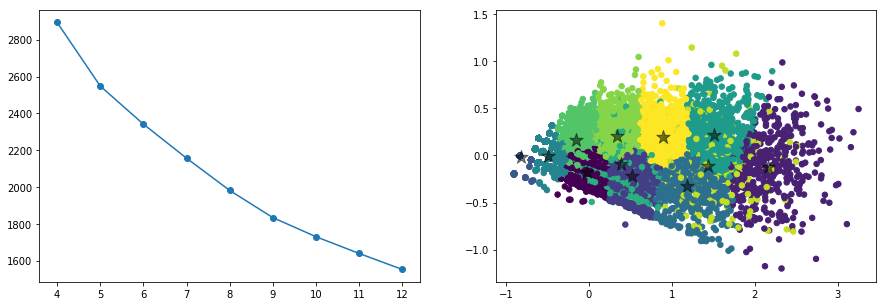

For number of clusters:  13 variance is : 1491.29246249


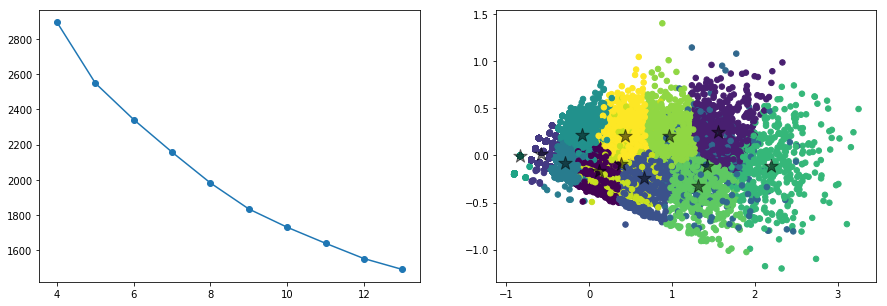

For number of clusters:  14 variance is : 1422.51178531


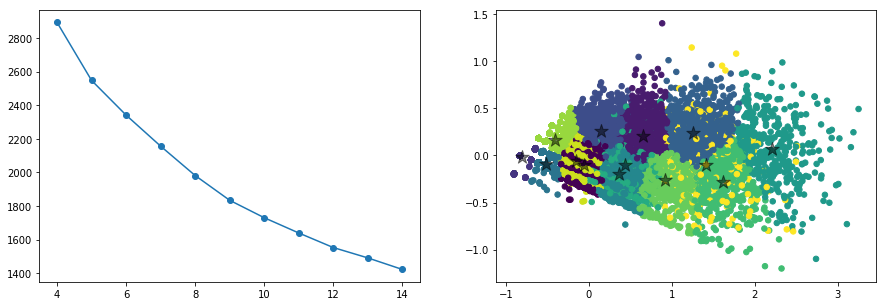

For number of clusters:  15 variance is : 1361.57102622


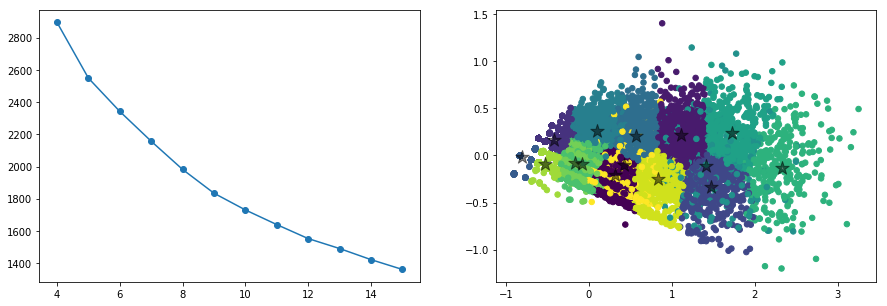

For number of clusters:  16 variance is : 1312.66390322


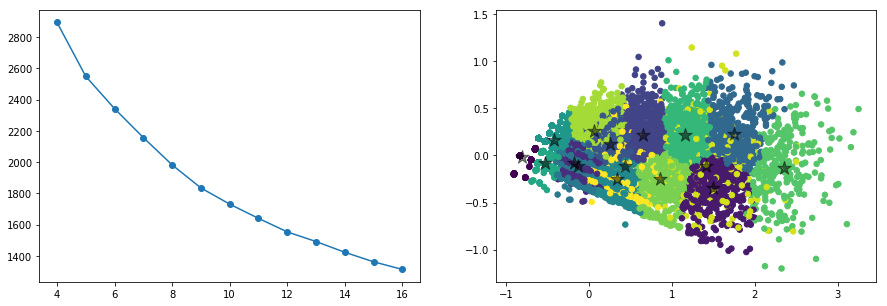

For number of clusters:  17 variance is : 1277.35544843


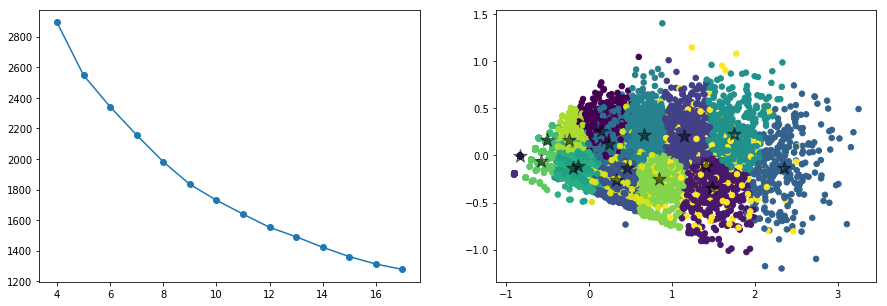

For number of clusters:  18 variance is : 1239.31215633


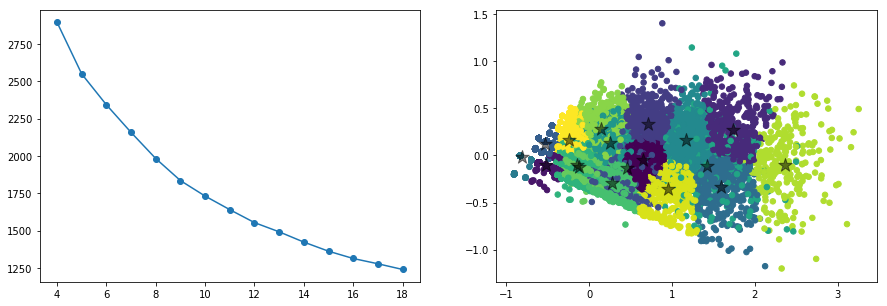

For number of clusters:  19 variance is : 1209.72570342


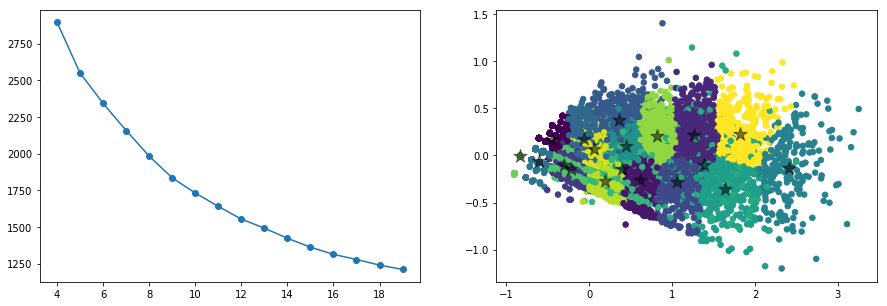

For number of clusters:  20 variance is : 1175.77949277


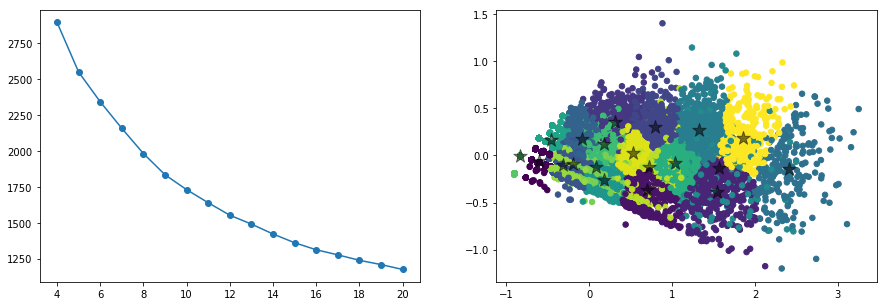

For number of clusters:  21 variance is : 1151.64805609


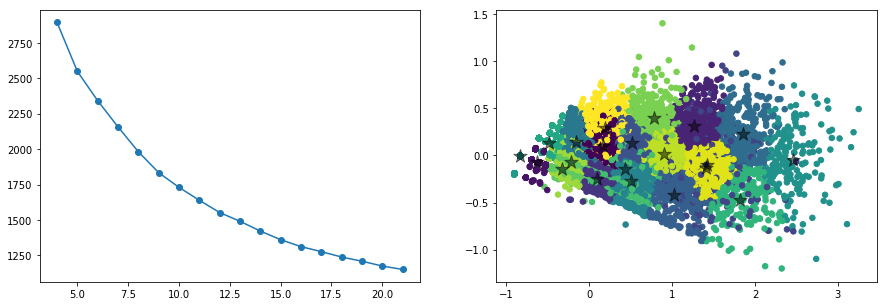

For number of clusters:  22 variance is : 1128.53710171


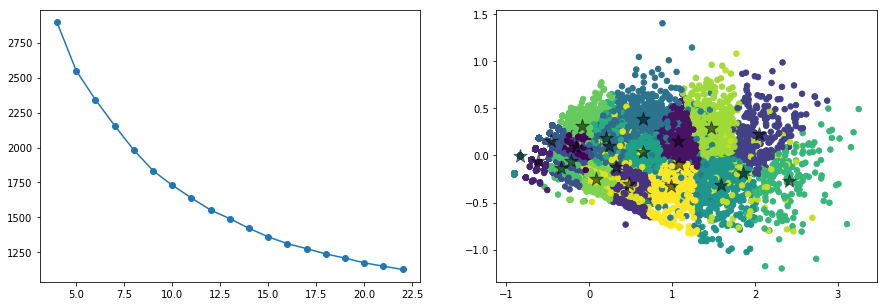

For number of clusters:  23 variance is : 1090.75822733


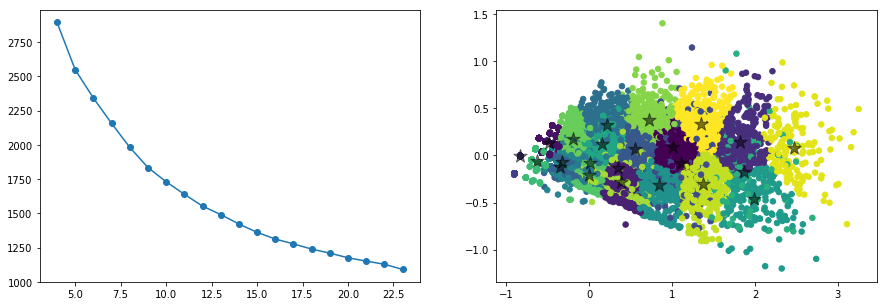

For number of clusters:  24 variance is : 1076.43085213


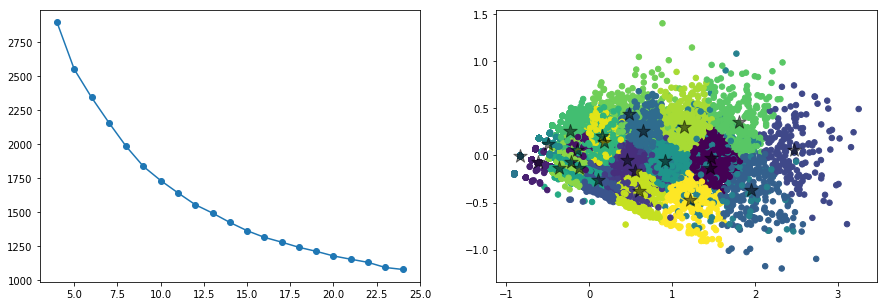

For number of clusters:  25 variance is : 1049.28645821


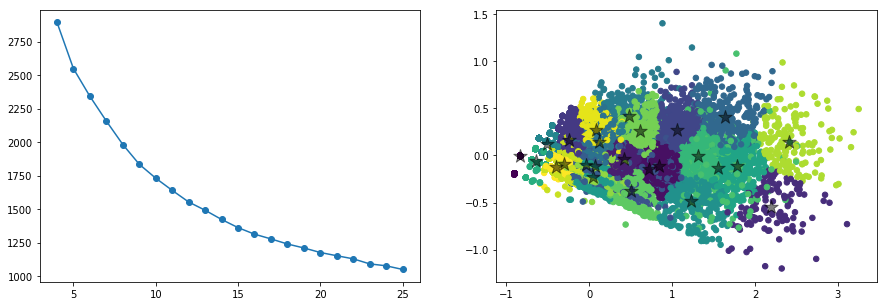

For number of clusters:  26 variance is : 1033.2397177


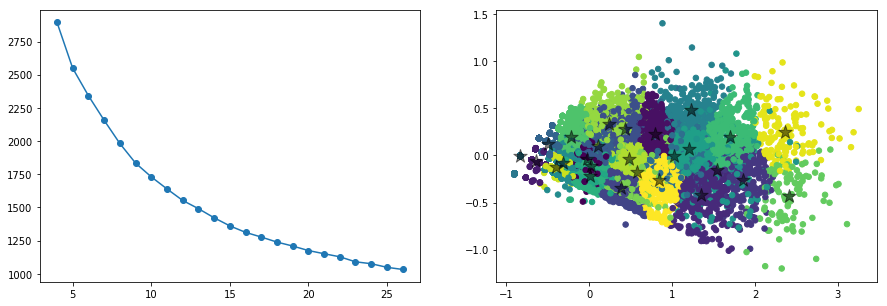

For number of clusters:  27 variance is : 1007.19060056


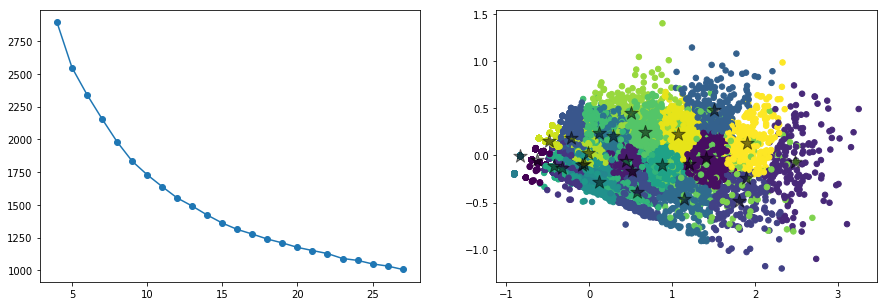

For number of clusters:  28 variance is : 989.356387889


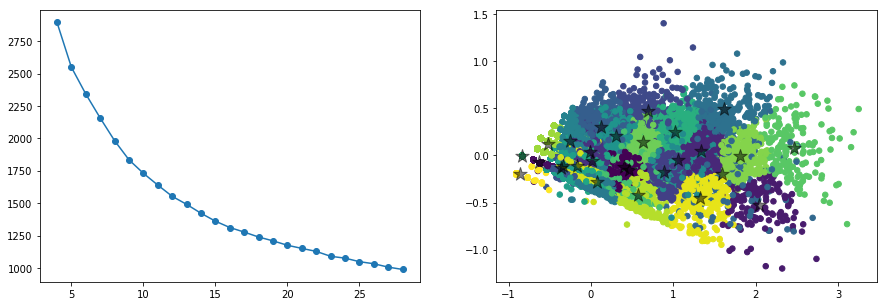

For number of clusters:  29 variance is : 977.80240022


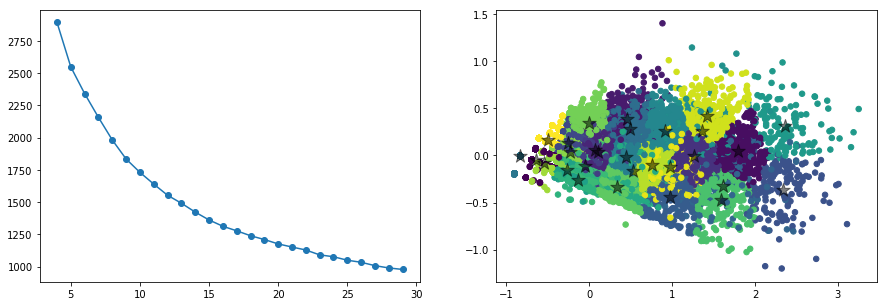

For number of clusters:  30 variance is : 957.774348342


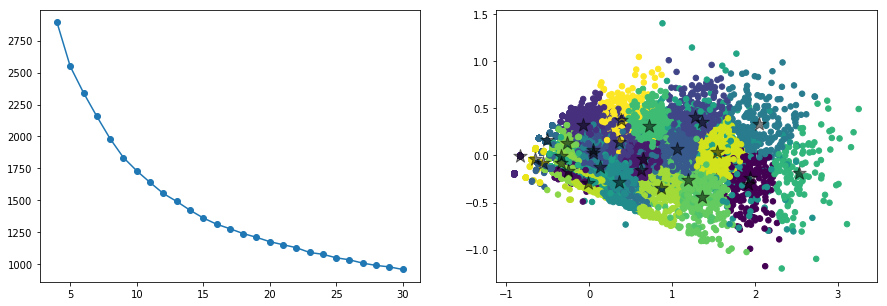

For number of clusters:  31 variance is : 942.217591861


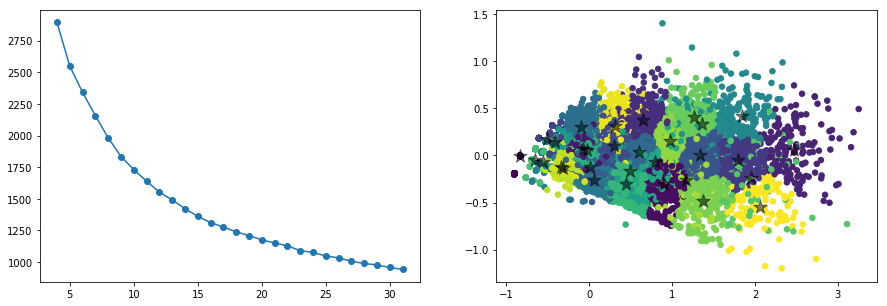

For number of clusters:  32 variance is : 919.699698576


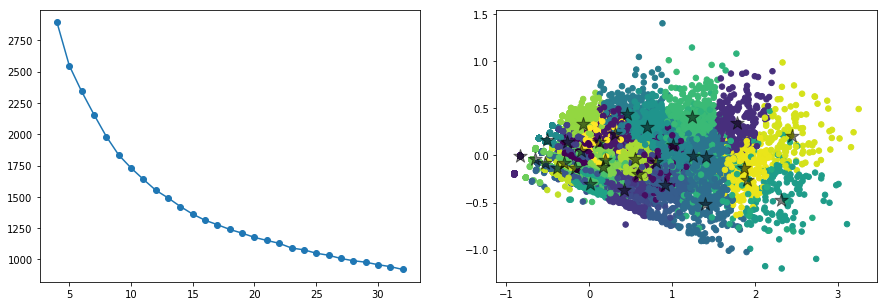

For number of clusters:  33 variance is : 912.676068575


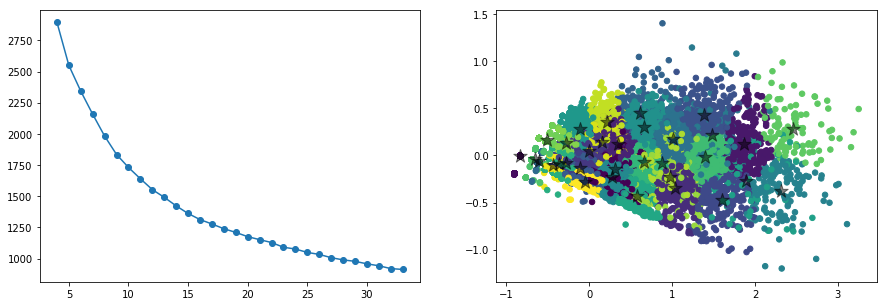

For number of clusters:  34 variance is : 891.689263013


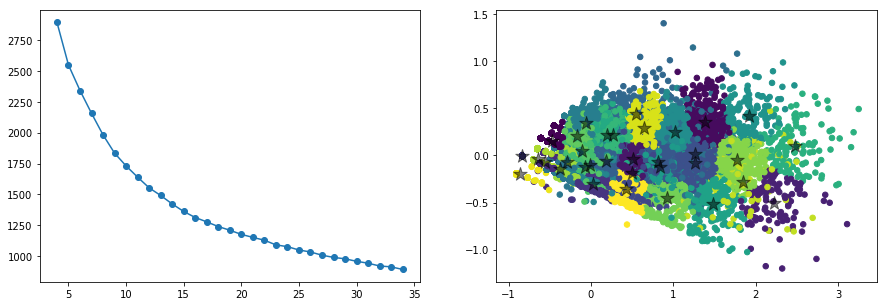

For number of clusters:  35 variance is : 877.686030073


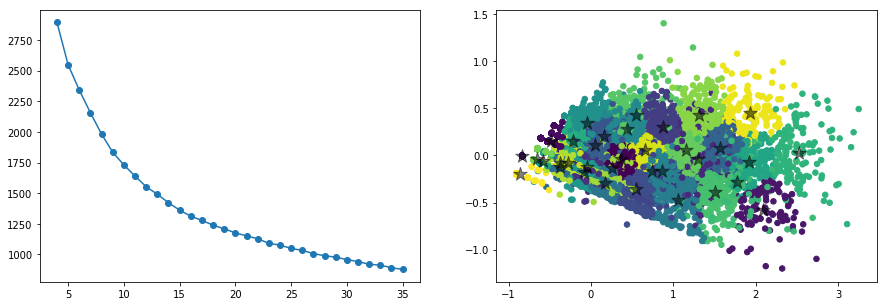

In [12]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
num_clusters = [4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35]
points = []
values = []




    

In [14]:
intermediate_data = feature_data_df[['pca-one','pca-two','pca-three','pca-four','pca-five','pca-six','pca-seven']]

('For n_clusters =', 4, 'The average silhouette_score is :', 0.40486631025086822)


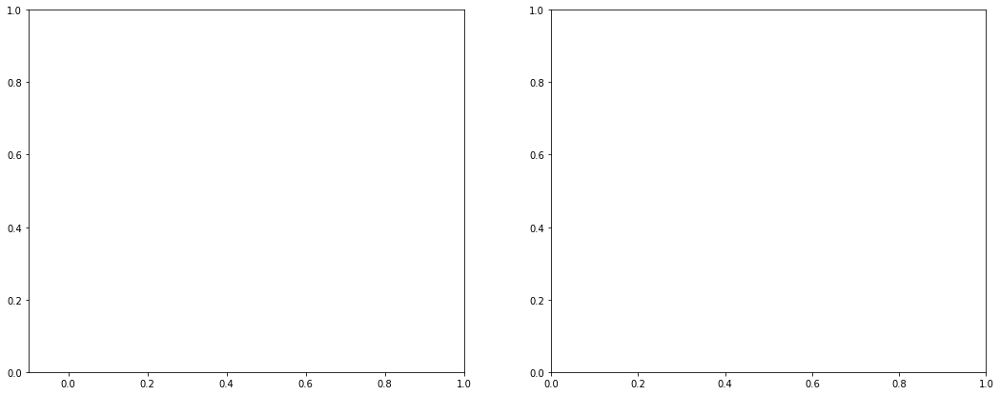

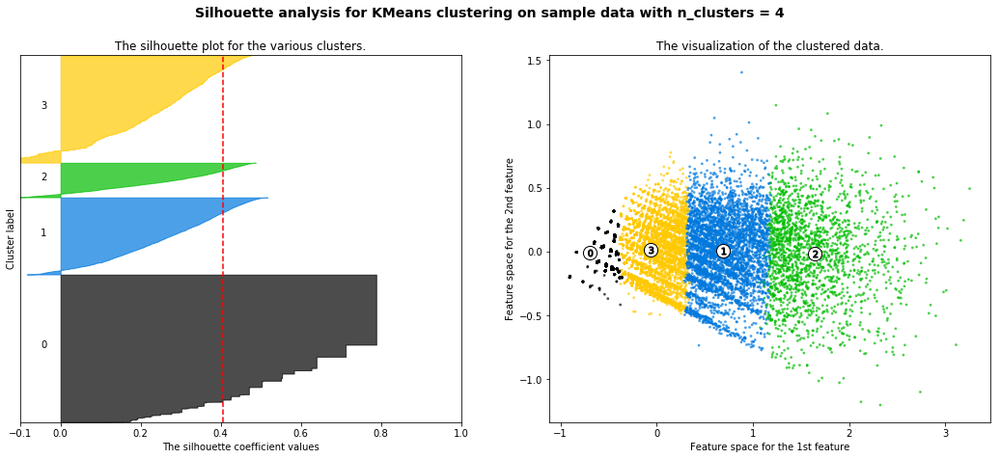

('For n_clusters =', 5, 'The average silhouette_score is :', 0.36633095149979122)


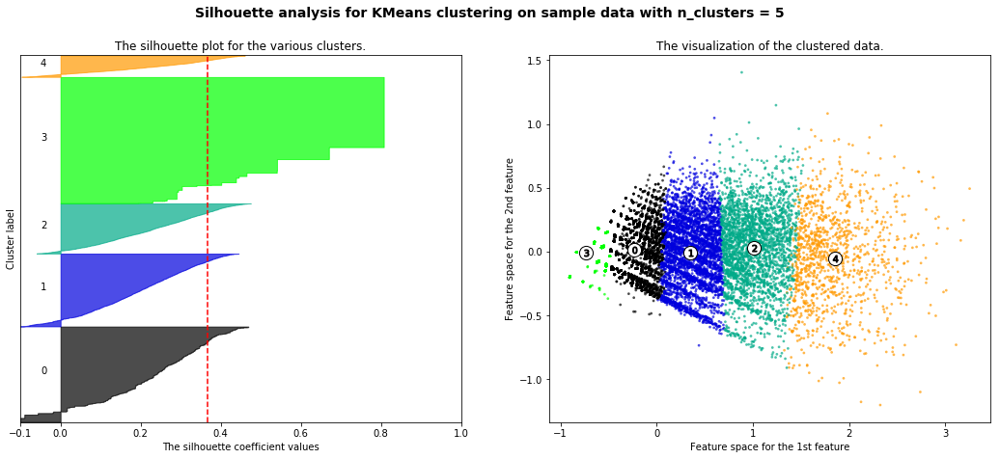

('For n_clusters =', 6, 'The average silhouette_score is :', 0.36593299148224118)


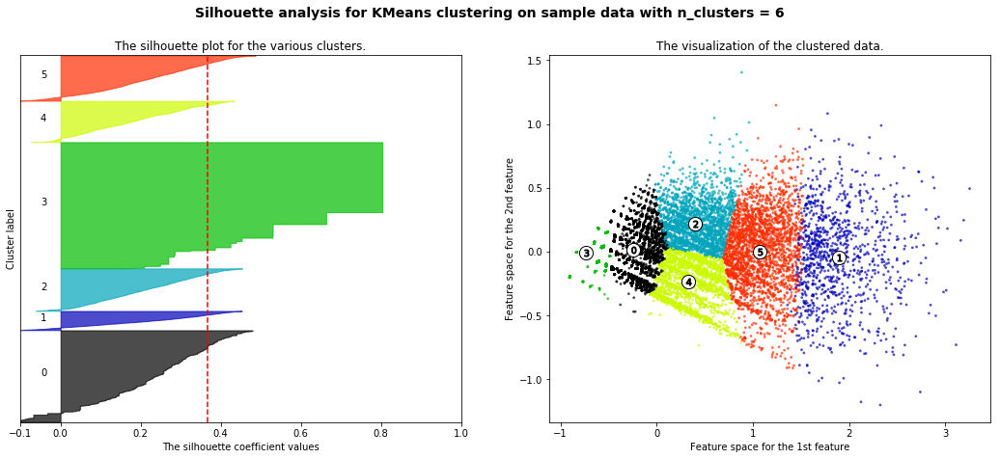

('For n_clusters =', 7, 'The average silhouette_score is :', 0.33328128197793699)


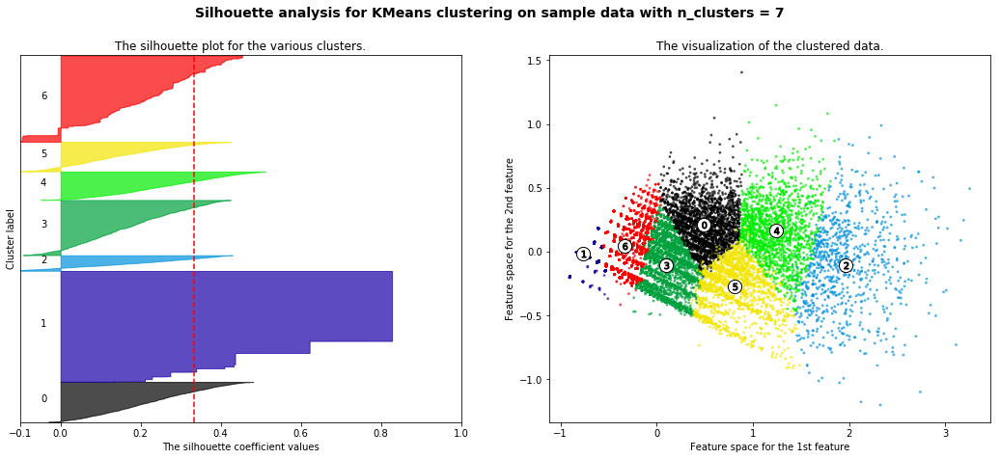

('For n_clusters =', 8, 'The average silhouette_score is :', 0.34102000404949573)


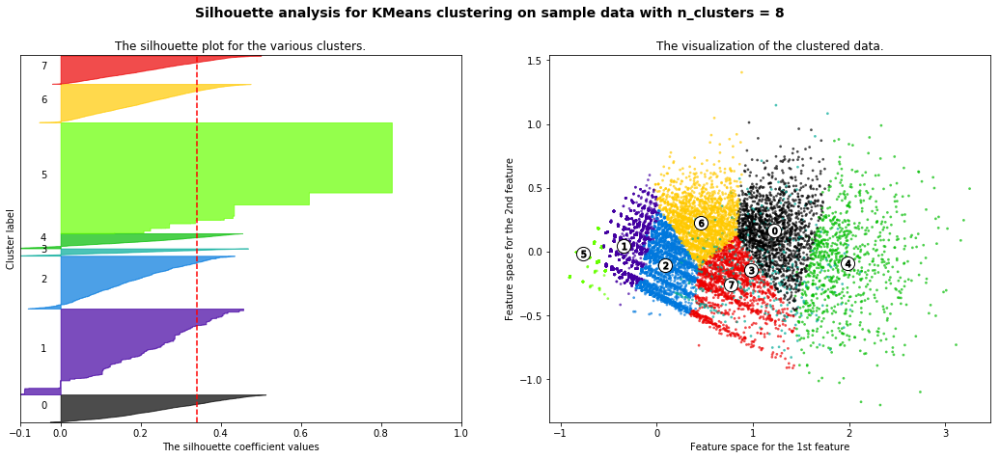

('For n_clusters =', 9, 'The average silhouette_score is :', 0.34491238460128965)


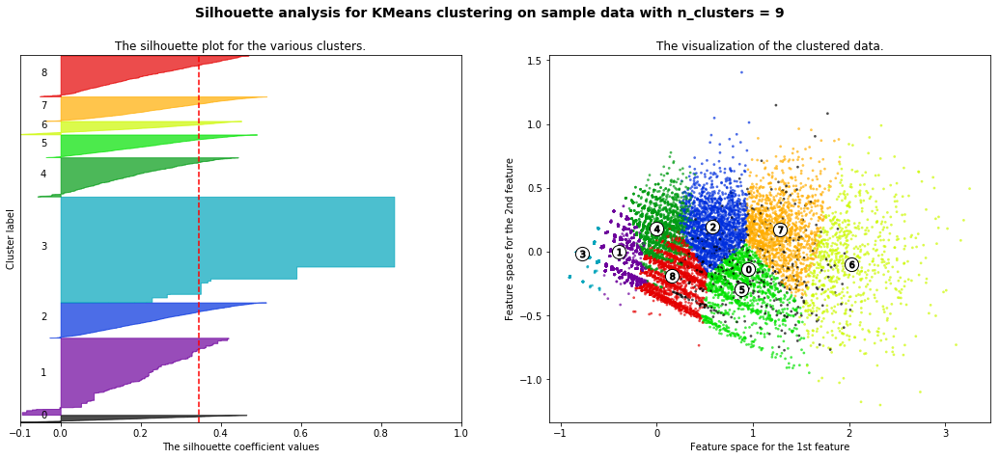

('For n_clusters =', 10, 'The average silhouette_score is :', 0.34841582601156845)


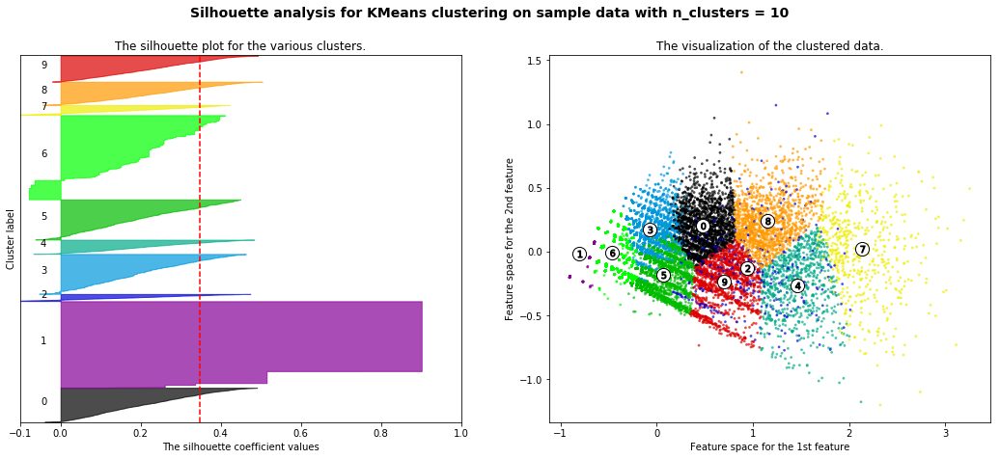

('For n_clusters =', 11, 'The average silhouette_score is :', 0.33806237856968507)


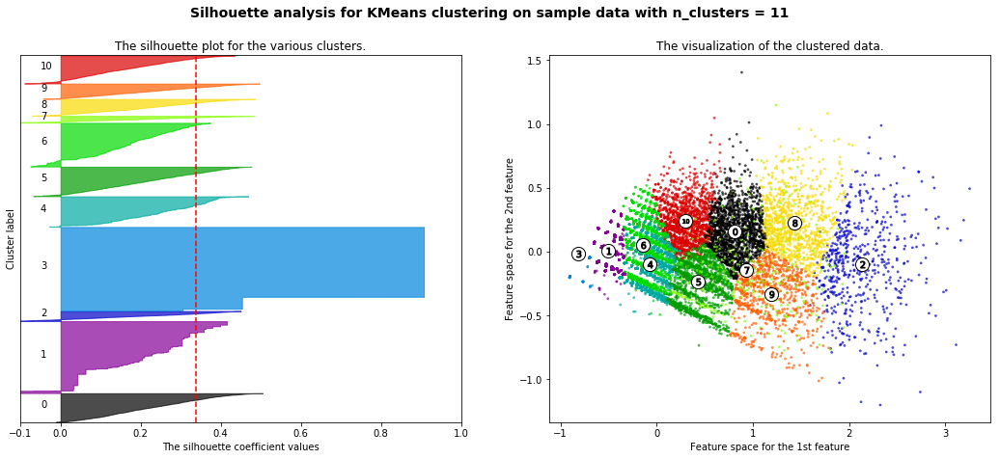

('For n_clusters =', 12, 'The average silhouette_score is :', 0.3395532483011785)


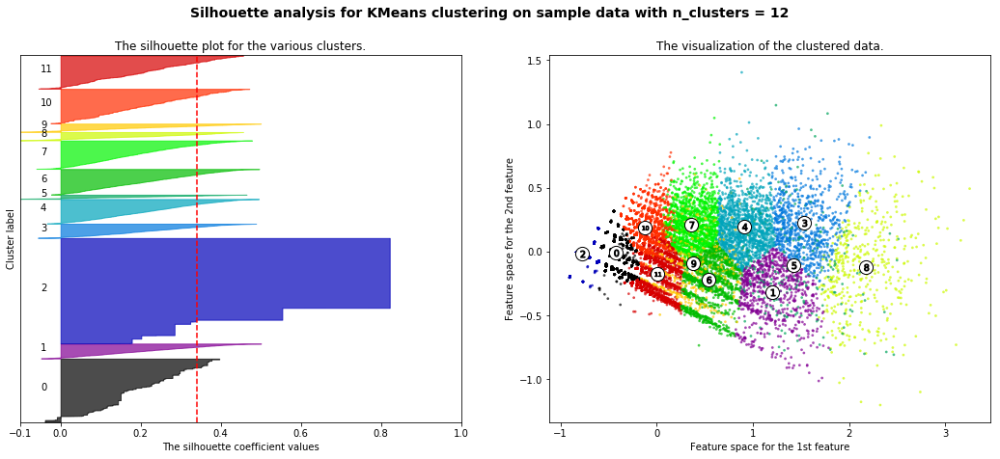

('For n_clusters =', 13, 'The average silhouette_score is :', 0.34149541282739659)


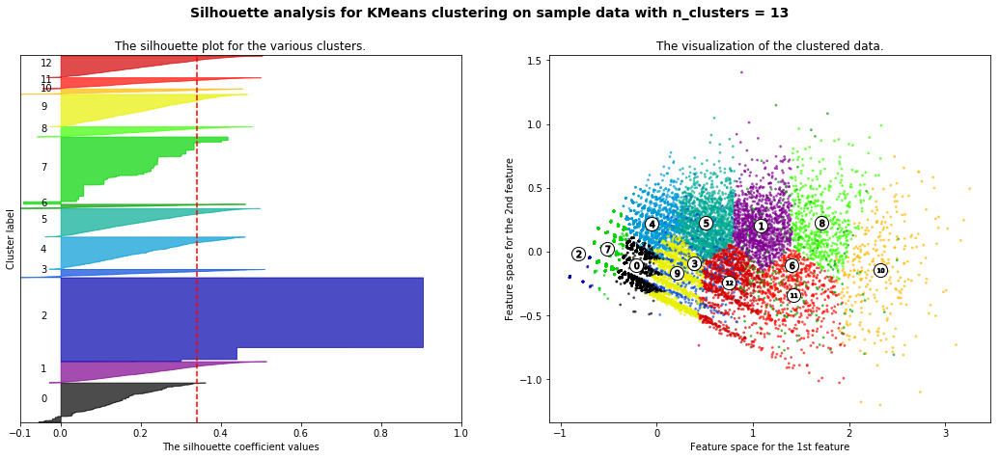

('For n_clusters =', 14, 'The average silhouette_score is :', 0.34846130988089075)


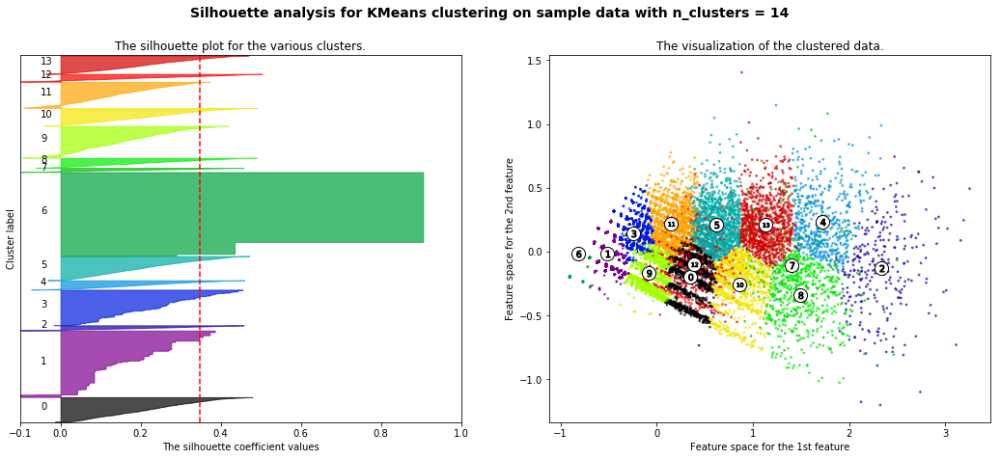

('For n_clusters =', 15, 'The average silhouette_score is :', 0.34065449671263531)


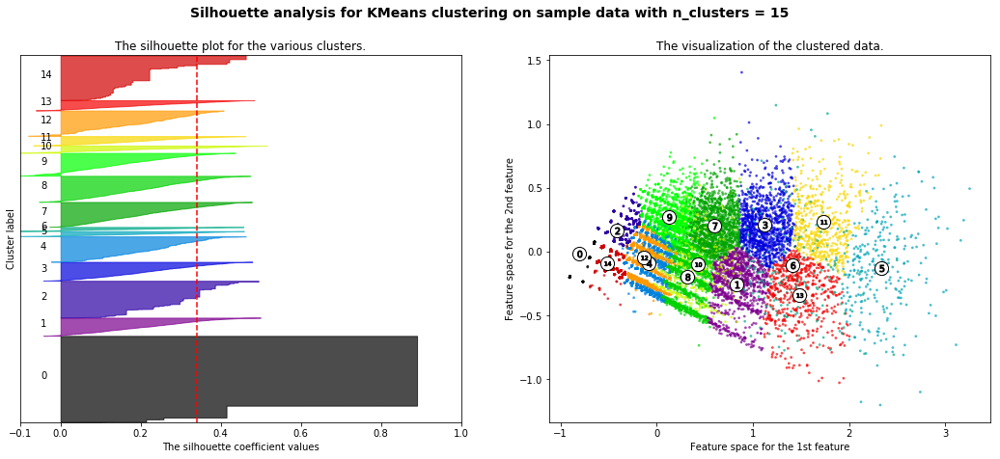

('For n_clusters =', 16, 'The average silhouette_score is :', 0.34793308416354779)


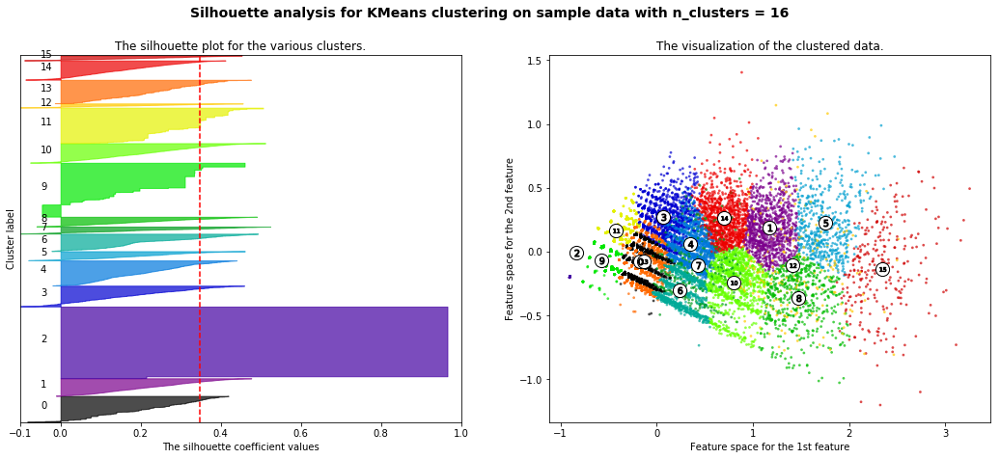

('For n_clusters =', 17, 'The average silhouette_score is :', 0.33872403351457475)


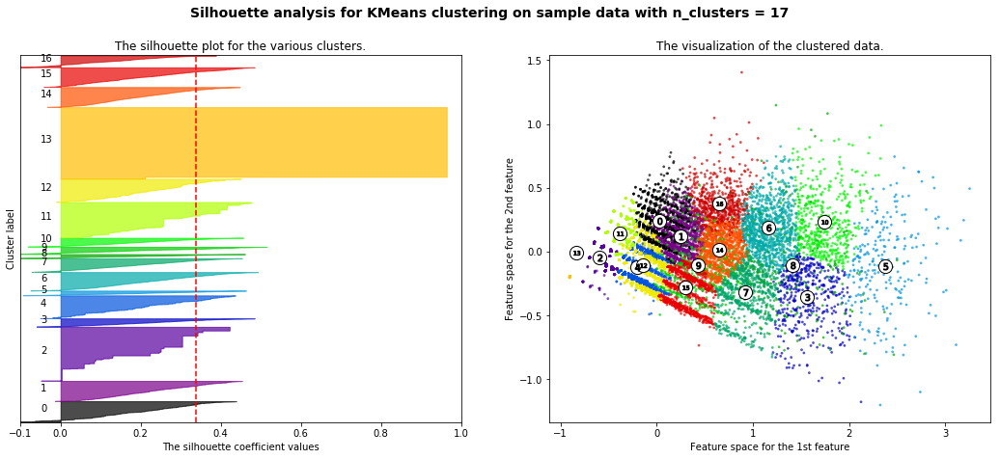

('For n_clusters =', 18, 'The average silhouette_score is :', 0.35278997528393452)


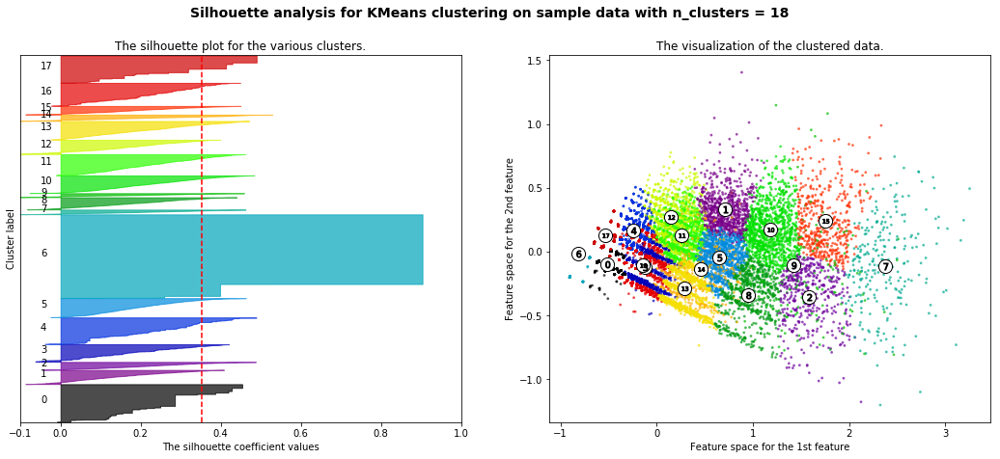

('For n_clusters =', 19, 'The average silhouette_score is :', 0.36075128040707916)


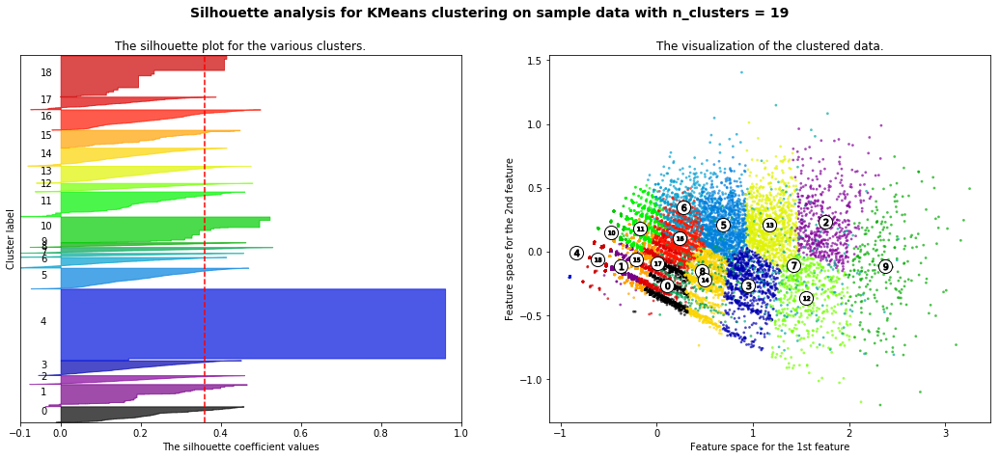

('For n_clusters =', 20, 'The average silhouette_score is :', 0.35349194364290459)


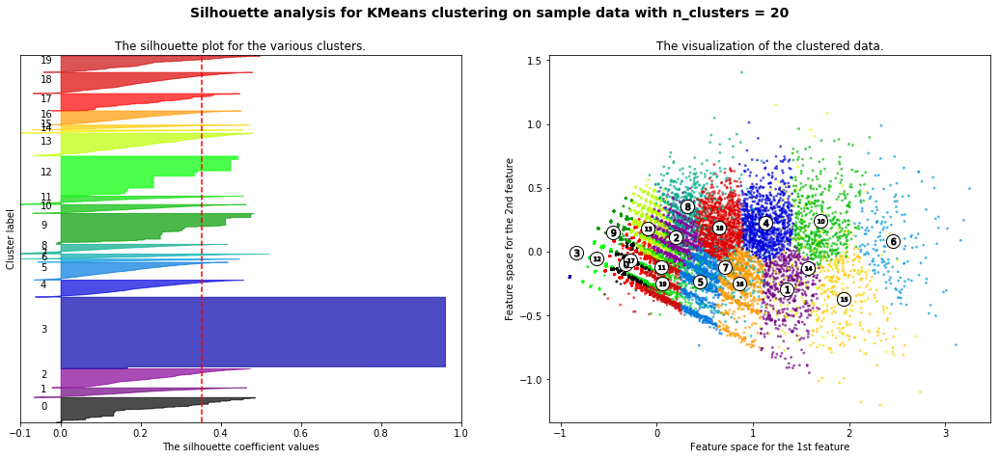

('For n_clusters =', 21, 'The average silhouette_score is :', 0.3620718553735216)


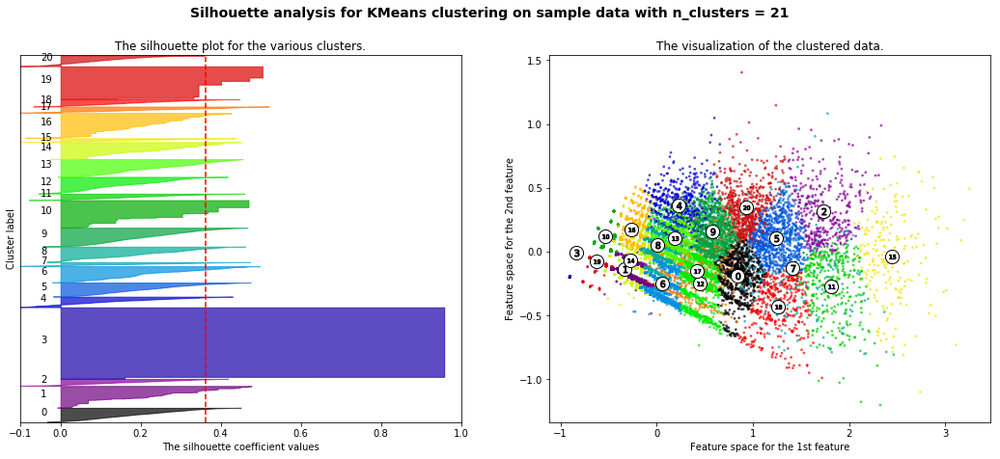

('For n_clusters =', 22, 'The average silhouette_score is :', 0.37490435435161013)


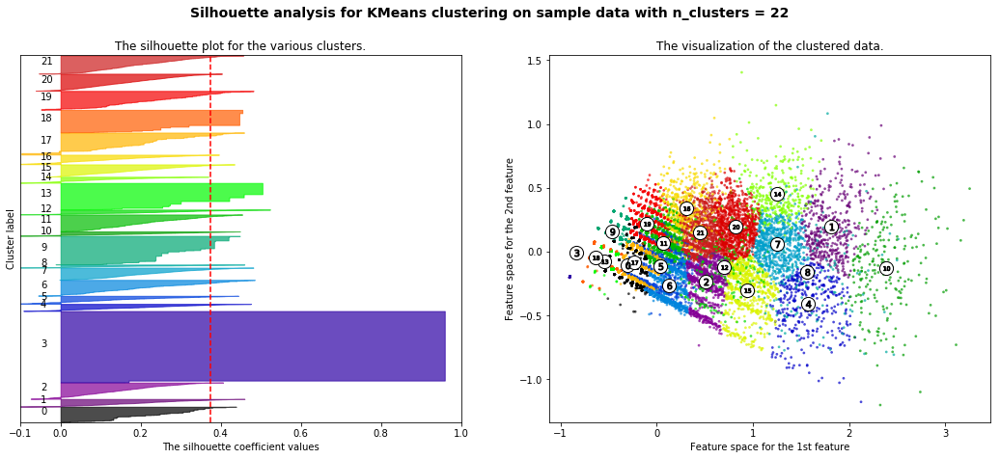

('For n_clusters =', 23, 'The average silhouette_score is :', 0.3432363114925524)


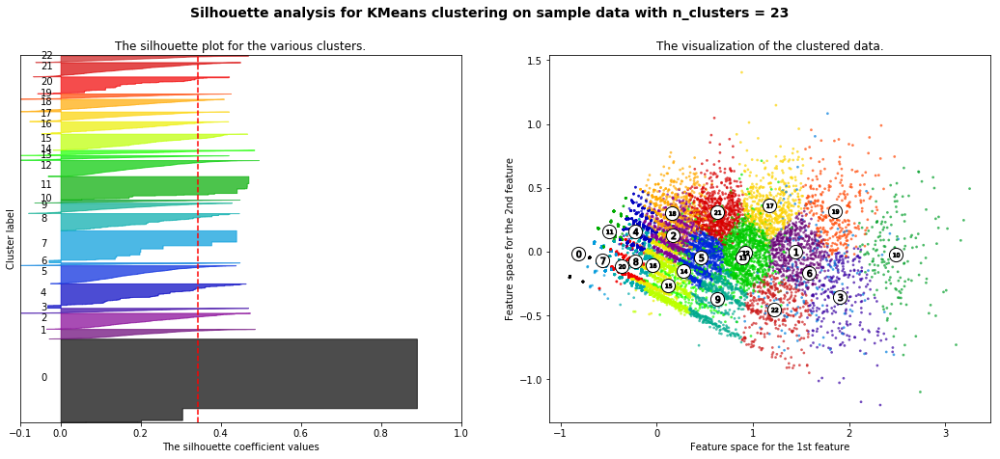

('For n_clusters =', 24, 'The average silhouette_score is :', 0.38010270174972605)


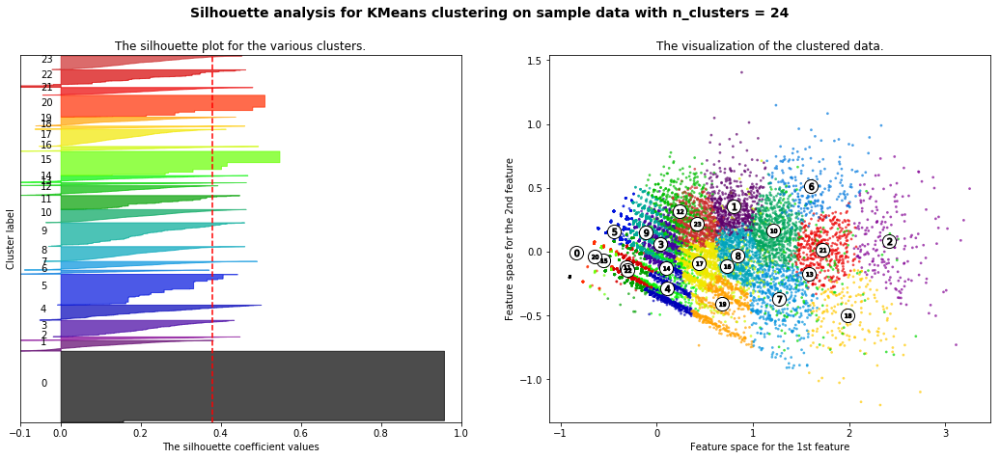

('For n_clusters =', 25, 'The average silhouette_score is :', 0.36460367184368336)


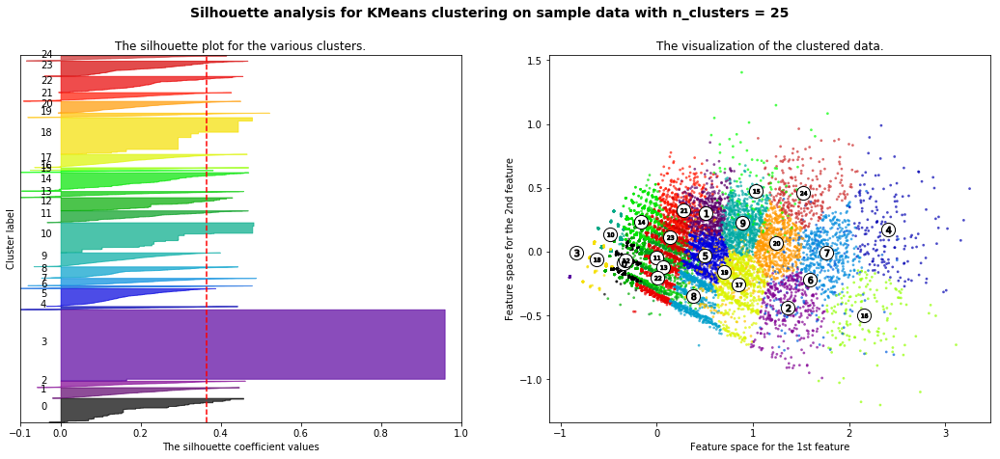

('For n_clusters =', 26, 'The average silhouette_score is :', 0.36732694218328604)


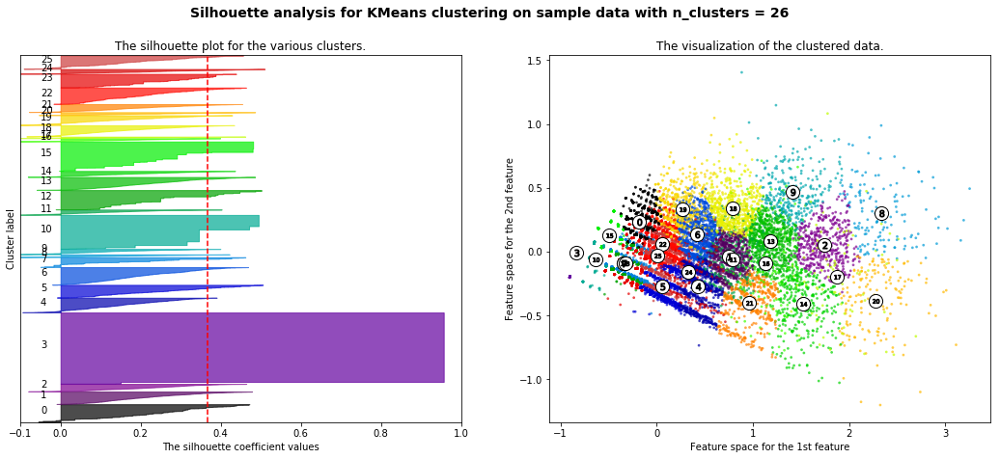

('For n_clusters =', 27, 'The average silhouette_score is :', 0.36920382157774778)


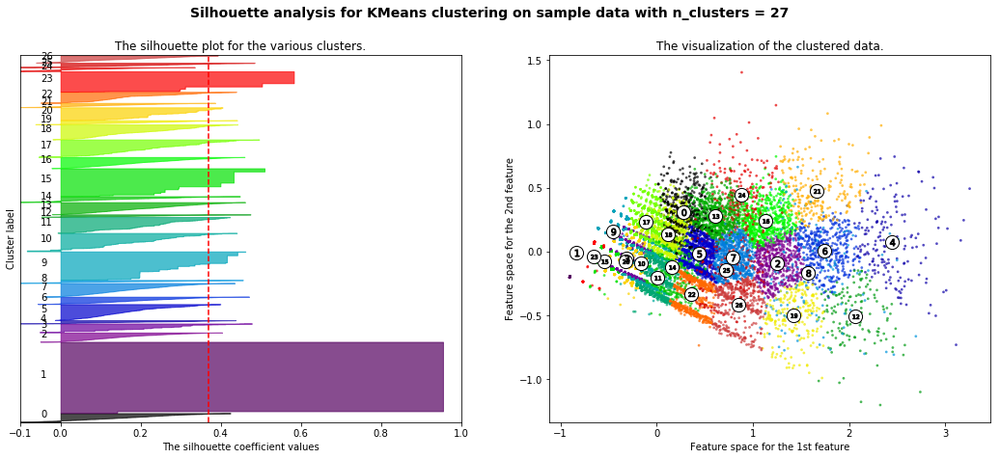

('For n_clusters =', 28, 'The average silhouette_score is :', 0.36549121648481347)


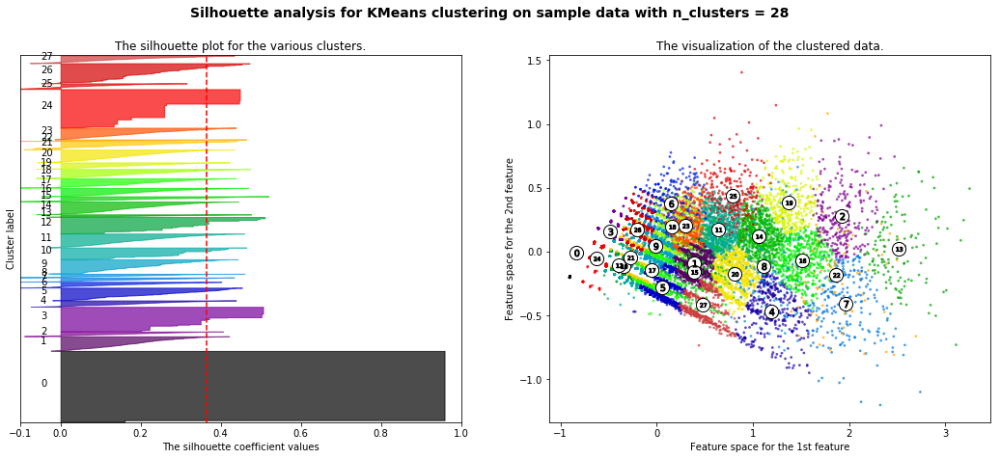

('For n_clusters =', 29, 'The average silhouette_score is :', 0.37467080970077599)


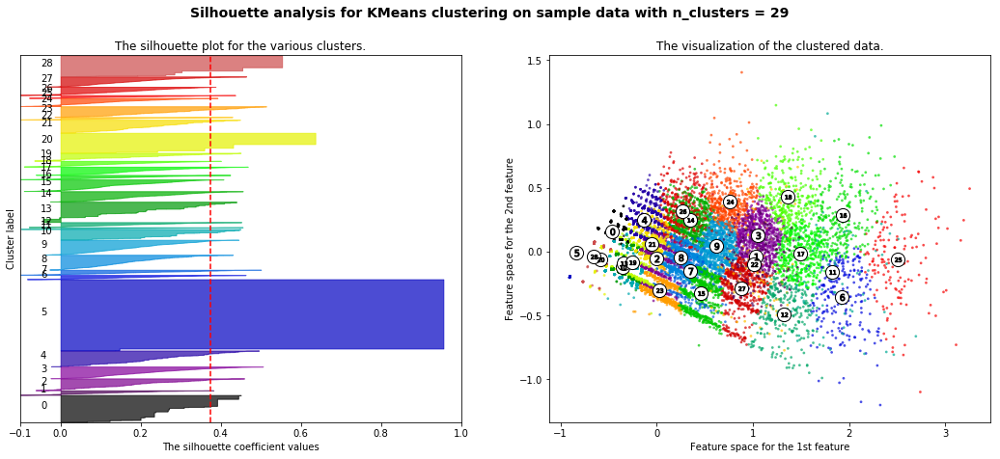

('For n_clusters =', 30, 'The average silhouette_score is :', 0.38468667190547617)


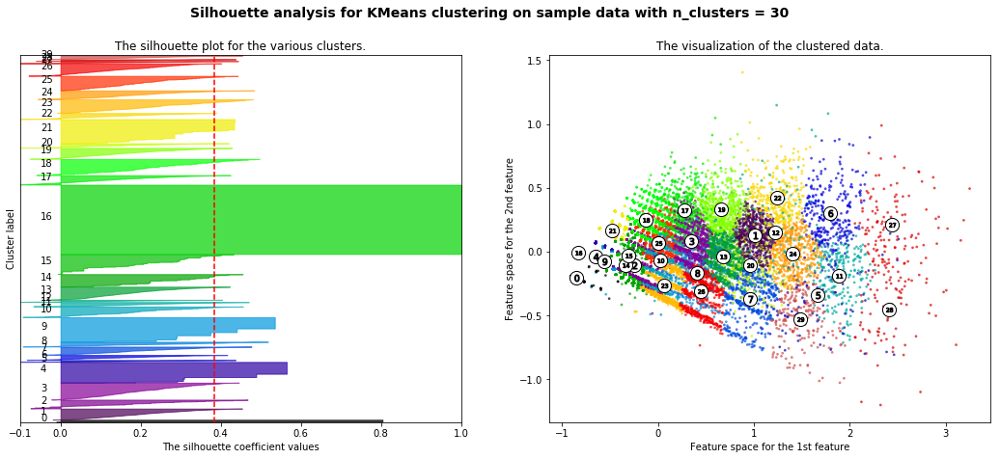

('For n_clusters =', 31, 'The average silhouette_score is :', 0.38917063511896399)


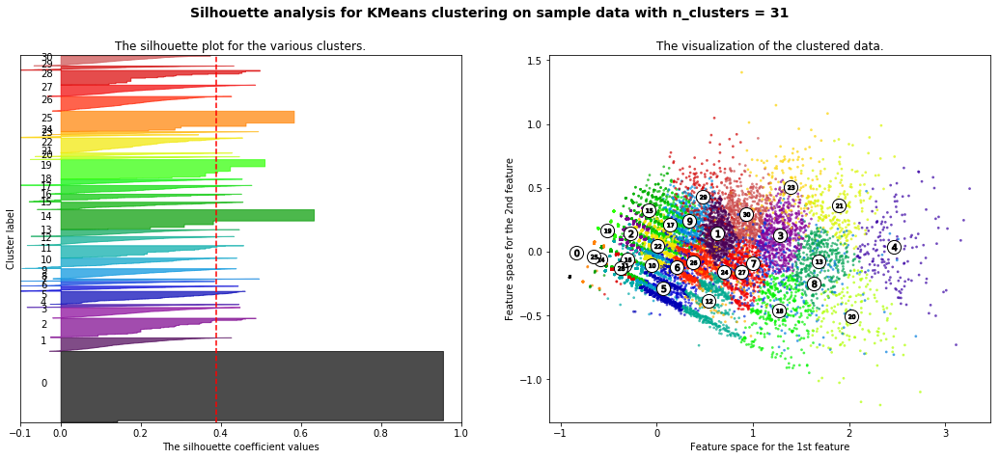

('For n_clusters =', 32, 'The average silhouette_score is :', 0.36341924722213503)


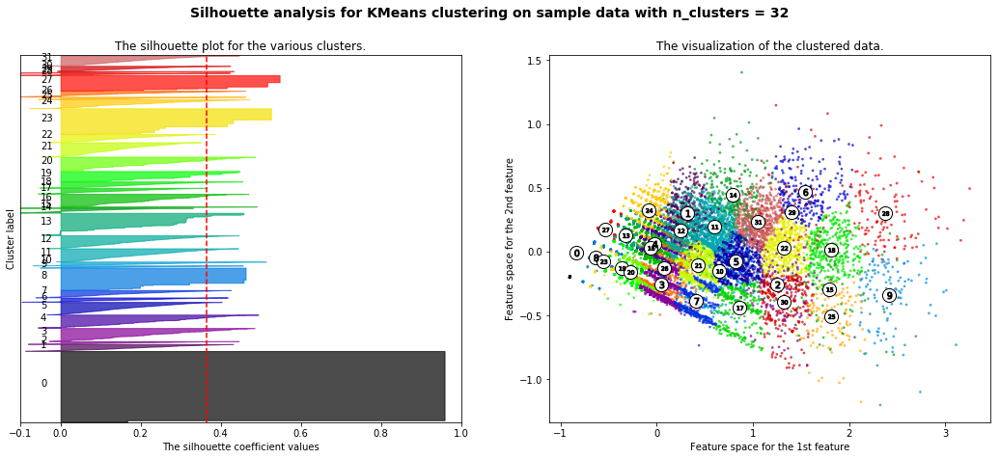

('For n_clusters =', 33, 'The average silhouette_score is :', 0.37489297025140211)


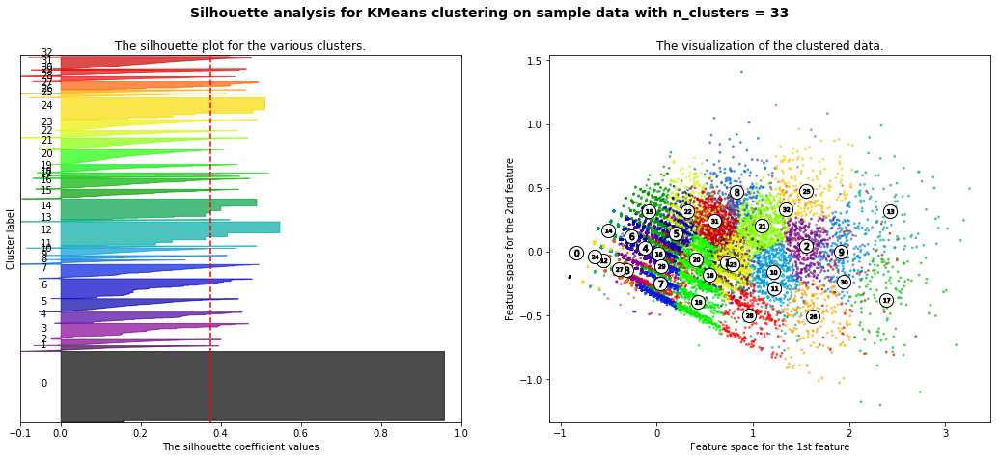

('For n_clusters =', 34, 'The average silhouette_score is :', 0.38698273682355278)


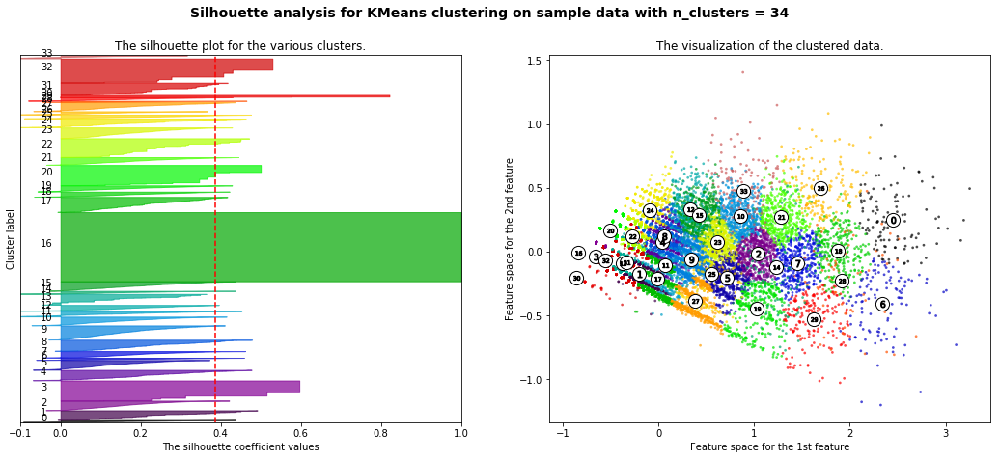

('For n_clusters =', 35, 'The average silhouette_score is :', 0.38870183651398593)


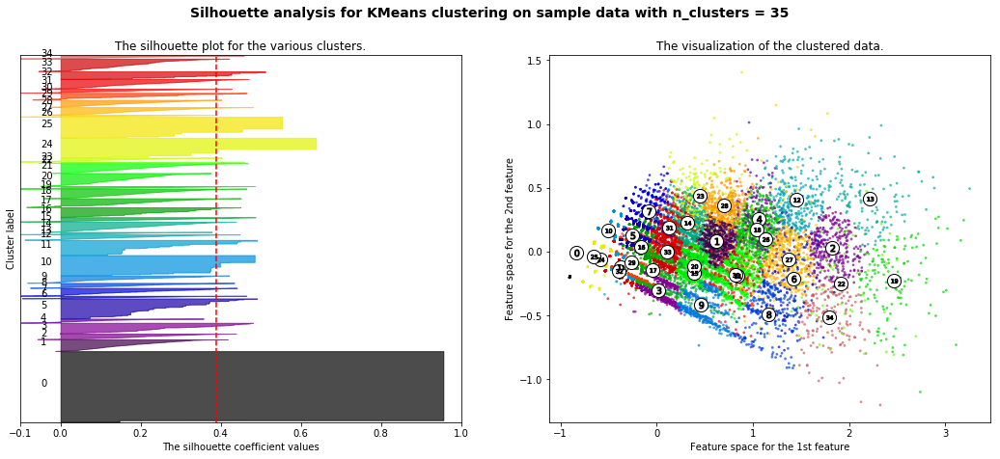

In [15]:

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


range_n_clusters = [4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(intermediate_data) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(intermediate_data)
    

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(intermediate_data, cluster_labels,sample_size = 3000)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(intermediate_data, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    X = intermediate_data.as_matrix(columns=intermediate_data.columns)

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

#     plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
#                   "with n_clusters = %d" % n_clusters),
#                  fontsize=14, fontweight='bold')

    plt.show()